# **Cumulative Distribution Function (CDF) Matching Method for RZSM Estimation**

* Author: Calvin Samwel Swai, March 2024

# **Introduction**

In this notebook Cumulative Ditribution Function (CDF) matching workflow for Root Zone Soil Moisture (RZSM) is introduced. This notebook is designed to implement the Statistical principles of CDF to retrieve RZSM time series from Surface Soil Moisture (SSM). This notebook was prepared as a part of the thesis objective designed to compare the capacity of both statistical and analytical approaches to retrieve RZSM from SSM in Twente region. For detailed information on the results please refer the accompanying report.

Details about the methodology design can also be found in the methodolgy section.

1. Preparations and Environment sett-up.
* This section involves preliminary steps such as installing and importing necessary libraries, as well as configuring the working environment.
2. Data input.
* Location of interest, In-situ Soil Moisture and grid Soil moisture records
3. Data processing and cleaning.
* SI unit conversions and in-situRZSM computations were the primary data cleaning procedures conducted in this notebook. Additional processing includes date and time column definition, temporal matching data time series, and finally outlier detection through scatterplots

4. CDF Matching Implementation
* Calibration and Validation

# **Preparations and Environment sett-up**

In [ ]:
#Import Libraries
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
workdr= '/content/drive/MyDrive/Tafiti'

In [ ]:
import ee
import geemap
import geemap.colormaps as cm

# Authenticate and initialize Earth Engine
ee.Authenticate()
ee.Initialize(project='ee-calvinsamwel94')

# **Data input**

In [ ]:
insitu_sm=pd.read_csv('/content/drive/MyDrive/Tafiti/Insitu_SM/ITCSM_02.csv')
insitu_sm.head()

,Date_time,_5_cm_SM,_5_cm_ST,_10_cm_SM,_10_cm_ST,_20_cm_SM,_20_cm_ST,_40_cm_SM,_40_cm_ST,_80_cm_SM,_80_cm_ST
0,01/01/2008 00:00,-99.999,-99.9,-99.999,-99.9,-99.999,-99.9,-99.999,-99.9,-99.999,-99.9
1,01/01/2008 00:15,-99.999,-99.9,-99.999,-99.9,-99.999,-99.9,-99.999,-99.9,-99.999,-99.9
2,01/01/2008 00:30,-99.999,-99.9,-99.999,-99.9,-99.999,-99.9,-99.999,-99.9,-99.999,-99.9
3,01/01/2008 00:45,-99.999,-99.9,-99.999,-99.9,-99.999,-99.9,-99.999,-99.9,-99.999,-99.9
4,01/01/2008 01:00,-99.999,-99.9,-99.999,-99.9,-99.999,-99.9,-99.999,-99.9,-99.999,-99.9


In [ ]:
#Select soil moisture station of interest
sm_stations = ee.FeatureCollection('users/calvinsamwel94/Twente_SM_Stations')
sm_stations=ee.FeatureCollection(sm_stations).filter(
  ee.Filter.inList('Station_ID', ['ITCSM_02']))

In [ ]:
NL = ee.FeatureCollection("users/qianrswaterr/GlobalSSM/gadm36_NLD_0")
#Map.addLayer(NL)
SM_RF_1km=ee.ImageCollection('users/qianrswaterr/GlobalSSM1km0509')


for i in range(2000, 2001):
  #filter the data in time
  image2000 = SM_RF_1km.filterMetadata('system:index','contains',str(i))
  #filter the data in space
  image2000 = image2000.filterMetadata('system:index','contains','Europe')
  image2000 = image2000.filterMetadata('system:index','ends_with','1km').first()
  print("Image for year", i)
  print(image2000.getInfo())
  #image=image.clip(NL)
  #Map.addLayer(image)

# Load the polygon shapefile from Google Drive
polygon = ee.FeatureCollection('users/calvinsamwel94/Overisal_Boundary')

Image for year 2000
{'type': 'Image', 'bands': [{'id': 'band_2000_03_05_classification', 'data_type': {'type': 'PixelType', 'precision': 'int', 'min': 0, 'max': 65535}, 'dimensions': [11158, 5224], 'crs': 'EPSG:4326', 'crs_transform': [0.008983152841195215, 0, -31.29730449872413, 0, -0.008983152841195215, 81.8544886889708]}, {'id': 'band_2000_03_06_classification', 'data_type': {'type': 'PixelType', 'precision': 'int', 'min': 0, 'max': 65535}, 'dimensions': [11158, 5224], 'crs': 'EPSG:4326', 'crs_transform': [0.008983152841195215, 0, -31.29730449872413, 0, -0.008983152841195215, 81.8544886889708]}, {'id': 'band_2000_03_07_classification', 'data_type': {'type': 'PixelType', 'precision': 'int', 'min': 0, 'max': 65535}, 'dimensions': [11158, 5224], 'crs': 'EPSG:4326', 'crs_transform': [0.008983152841195215, 0, -31.29730449872413, 0, -0.008983152841195215, 81.8544886889708]}, {'id': 'band_2000_03_08_classification', 'data_type': {'type': 'PixelType', 'precision': 'int', 'min': 0, 'max': 65

In [ ]:
image2000

In [ ]:
start_year = 2001
end_year = 2020

# Create an ee.image object with 2000 image dataset to stack the following years with
image_stack = ee.Image(image2000)

# Iterate over each year in the date range
for i in range(start_year, end_year + 1):
    # Filter the data in time
    image = (SM_RF_1km
             .filterMetadata('system:index', 'contains', str(i))
             # Filter the data in space
             .filterMetadata('system:index', 'contains', 'Europe')
             .filterMetadata('system:index', 'ends_with', '1km')
             .first())

    # Add the current image's bands to the image stack
    image_stack = image_stack.addBands(image)

# Print the stacked image
print("Stacked Image:", image_stack.getInfo())

Stacked Image: {'type': 'Image', 'bands': [{'id': 'band_2000_03_05_classification', 'data_type': {'type': 'PixelType', 'precision': 'int', 'min': 0, 'max': 65535}, 'dimensions': [11158, 5224], 'crs': 'EPSG:4326', 'crs_transform': [0.008983152841195215, 0, -31.29730449872413, 0, -0.008983152841195215, 81.8544886889708]}, {'id': 'band_2000_03_06_classification', 'data_type': {'type': 'PixelType', 'precision': 'int', 'min': 0, 'max': 65535}, 'dimensions': [11158, 5224], 'crs': 'EPSG:4326', 'crs_transform': [0.008983152841195215, 0, -31.29730449872413, 0, -0.008983152841195215, 81.8544886889708]}, {'id': 'band_2000_03_07_classification', 'data_type': {'type': 'PixelType', 'precision': 'int', 'min': 0, 'max': 65535}, 'dimensions': [11158, 5224], 'crs': 'EPSG:4326', 'crs_transform': [0.008983152841195215, 0, -31.29730449872413, 0, -0.008983152841195215, 81.8544886889708]}, {'id': 'band_2000_03_08_classification', 'data_type': {'type': 'PixelType', 'precision': 'int', 'min': 0, 'max': 65535},

In [ ]:
image_stack

In [ ]:
# Define a function to extract band values from the image at each point
def extract_band_values(feature):
    point = feature.geometry()
    values = image_stack.sample(point).first().toDictionary()
    return ee.Feature(point).set(values)

# Map the extraction function over the points FeatureCollection
try:
    extracted_data = sm_stations.map(extract_band_values).getInfo()
    print("Extraction successful!")
    print("Extracted Data:", extracted_data)
except Exception as e:
    print("Error during extraction:", e)
    extracted_data = None

Extraction successful!
Extracted Data: {'type': 'FeatureCollection', 'columns': {}, 'version': 1695217045456189, 'id': 'users/calvinsamwel94/Twente_SM_Stations', 'properties': {'system:asset_size': 12826}, 'features': [{'type': 'Feature', 'geometry': {'type': 'Point', 'coordinates': [6.857218977292232, 52.3900005724409]}, 'id': '00000000000000000001', 'properties': {'band_2000_03_05_classification': 443, 'band_2000_03_06_classification': 424, 'band_2000_03_07_classification': 385, 'band_2000_03_08_classification': 379, 'band_2000_03_09_classification': 391, 'band_2000_03_10_classification': 424, 'band_2000_03_11_classification': 397, 'band_2000_03_12_classification': 411, 'band_2000_03_13_classification': 381, 'band_2000_03_14_classification': 411, 'band_2000_03_15_classification': 421, 'band_2000_03_16_classification': 376, 'band_2000_03_17_classification': 380, 'band_2000_03_18_classification': 407, 'band_2000_03_19_classification': 390, 'band_2000_03_20_classification': 399, 'band_2

In [ ]:
feature_list = extracted_data['features']

In [ ]:
import pandas as pd
# Convert the FeatureCollection to a list of dictionaries
#feature_list = extracted_data.getInfo()['features']

# Initialize an empty list to store dictionaries for each feature
data_list = []

# Iterate over features and extract properties
for feature in feature_list:
    properties = feature['properties']
    data_list.append(properties)

# Convert the list of dictionaries to a Pandas DataFrame
df = pd.DataFrame(data_list)

df.head()

,band_2000_03_05_classification,band_2000_03_06_classification,band_2000_03_07_classification,band_2000_03_08_classification,band_2000_03_09_classification,band_2000_03_10_classification,band_2000_03_11_classification,band_2000_03_12_classification,band_2000_03_13_classification,band_2000_03_14_classification,...,band_2020_12_22_classification,band_2020_12_23_classification,band_2020_12_24_classification,band_2020_12_25_classification,band_2020_12_26_classification,band_2020_12_27_classification,band_2020_12_28_classification,band_2020_12_29_classification,band_2020_12_30_classification,band_2020_12_31_classification
0,443,424,385,379,391,424,397,411,381,411,...,357,390,404,404,392,414,410,403,416,420


In [ ]:
columns=df.columns
# Extract the date information from the column names
df['date'] = pd.to_datetime(df.columns.str.extract(r'band_(\d{4}_\d{2}_\d{2})')[0], format='%Y_%m_%d')

# Melt the DataFrame
melted_df = pd.melt(df, id_vars=['date'], value_vars=columns, var_name='Date', value_name='SM')

# Print the reshaped DataFrame
print(melted_df)

           date                            Date   SM
0    2000-03-05  band_2000_03_05_classification  443
1    2000-03-05  band_2000_03_06_classification  424
2    2000-03-05  band_2000_03_07_classification  385
3    2000-03-05  band_2000_03_08_classification  379
4    2000-03-05  band_2000_03_09_classification  391
...         ...                             ...  ...
7544 2000-03-05  band_2020_12_27_classification  414
7545 2000-03-05  band_2020_12_28_classification  410
7546 2000-03-05  band_2020_12_29_classification  403
7547 2000-03-05  band_2020_12_30_classification  416
7548 2000-03-05  band_2020_12_31_classification  420

[7549 rows x 3 columns]


In [ ]:
df_filtered = melted_df[melted_df['Date'] != 'SM_10m_203']
df_filtered = df_filtered[df_filtered['Date'] != 'SM_10m_201']
df_filtered = df_filtered[df_filtered['Date'] != 'SM_10m_202']
df_filtered = df_filtered[df_filtered['Date'] != 'SM_10m_204']
df_filtered = df_filtered[df_filtered['Date'] != 'SM_10m_205']
df_filtered = df_filtered[df_filtered['Date'] != 'SM_10m_206']
df_filtered = df_filtered[df_filtered['Date'] != 'Station_ID']
df_filtered = df_filtered[df_filtered['Date'] != 'latitude__']
df_filtered = df_filtered[df_filtered['Date'] != 'longitude']
df_filtered = df_filtered[df_filtered['Date'] != 'status']

In [ ]:
df_filtered['Date'] = df_filtered['Date'].str.extract(r'band_(\d{4}_\d{2}_\d{2})_classification', expand=False)

# **Data processing and cleaning.**

In [ ]:
df_filtered['Date'] = df_filtered['Date'].str.replace('_', '/')
df_filtered['Date']=pd.to_datetime(df_filtered['Date'], errors='coerce')
df_filtered['SSM']=df_filtered['SM']/1000
df_filtered=df_filtered[['Date','SSM']].reset_index(drop=True)
df_filtered

,Date,SSM
0,2000-03-05,0.443
1,2000-03-06,0.424
2,2000-03-07,0.385
3,2000-03-08,0.379
4,2000-03-09,0.391
...,...,...
7544,2020-12-27,0.414
7545,2020-12-28,0.410
7546,2020-12-29,0.403
7547,2020-12-30,0.416


In [ ]:
gssm=df_filtered
gssm['Date'] = gssm['Date'].dt.strftime('%d-%m-%Y')
gssm

,Date,SSM
0,05-03-2000,0.443
1,06-03-2000,0.424
2,07-03-2000,0.385
3,08-03-2000,0.379
4,09-03-2000,0.391
...,...,...
7544,27-12-2020,0.414
7545,28-12-2020,0.410
7546,29-12-2020,0.403
7547,30-12-2020,0.416


In [ ]:
#Make a monthly mean dataset
# Convert 'Date' column to datetime object
# gssm['Date'] = pd.to_datetime(gssm['Date'])
gssm['Date'] = pd.to_datetime(gssm['Date'], format='%d-%m-%Y')

# Set 'Date' column as the index
gssm.set_index('Date', inplace=True)

# Resample data to daily frequency and calculate the mean
gssm = gssm.resample('D').mean()

# Reset index to make 'Date' a regular column again
gssm.reset_index(inplace=True)

# Convert 'Date' column back to the desired format
gssm['Date'] = gssm['Date'].dt.strftime('%d-%m-%Y')
gssm

,Date,SSM
0,05-03-2000,0.443
1,06-03-2000,0.424
2,07-03-2000,0.385
3,08-03-2000,0.379
4,09-03-2000,0.391
...,...,...
7602,27-12-2020,0.414
7603,28-12-2020,0.410
7604,29-12-2020,0.403
7605,30-12-2020,0.416


In [ ]:
# Mask to match insitu date ranges
# gssm['Date'] = pd.to_datetime(gssm['Date'])
gssm=gssm.groupby('Date').mean()
gssm[gssm<0]=np.nan
gssm=gssm.reset_index()
gssm

,Date,SSM
0,01-01-2001,0.410
1,01-01-2002,0.381
2,01-01-2003,0.427
3,01-01-2004,0.402
4,01-01-2005,0.450
...,...,...
7602,31-12-2016,0.363
7603,31-12-2017,0.321
7604,31-12-2018,0.348
7605,31-12-2019,0.394


In [ ]:
insitu_sm['Date_time'] = insitu_sm['Date_time'].astype(str)
insitu_sm[['Date', 'time']] = insitu_sm['Date_time'].str.split(expand=True)

insitu_sm.head()

,Date_time,_5_cm_SM,_5_cm_ST,_10_cm_SM,_10_cm_ST,_20_cm_SM,_20_cm_ST,_40_cm_SM,_40_cm_ST,_80_cm_SM,_80_cm_ST,Date,time
0,01/01/2008 00:00,-99.999,-99.9,-99.999,-99.9,-99.999,-99.9,-99.999,-99.9,-99.999,-99.9,01/01/2008,00:00
1,01/01/2008 00:15,-99.999,-99.9,-99.999,-99.9,-99.999,-99.9,-99.999,-99.9,-99.999,-99.9,01/01/2008,00:15
2,01/01/2008 00:30,-99.999,-99.9,-99.999,-99.9,-99.999,-99.9,-99.999,-99.9,-99.999,-99.9,01/01/2008,00:30
3,01/01/2008 00:45,-99.999,-99.9,-99.999,-99.9,-99.999,-99.9,-99.999,-99.9,-99.999,-99.9,01/01/2008,00:45
4,01/01/2008 01:00,-99.999,-99.9,-99.999,-99.9,-99.999,-99.9,-99.999,-99.9,-99.999,-99.9,01/01/2008,01:00


In [ ]:
insitu_sm['Date'] = pd.to_datetime(insitu_sm['Date'], format='%d/%m/%Y')

# Set 'Date' column as the index
insitu_sm.set_index('Date', inplace=True)

# Drop non-numeric columns
numeric_columns = insitu_sm.select_dtypes(include=['float64', 'int64']).columns
insitu_sm_numeric = insitu_sm[numeric_columns]

# Resample data to daily frequency and calculate the mean for numeric columns
daily_mean_insitu_sm = insitu_sm_numeric.resample('D').mean()

# Reset index to make 'Date' a regular column again
daily_mean_insitu_sm.reset_index(inplace=True)

# Convert 'Date' column back to the desired format
daily_mean_insitu_sm['Date'] = daily_mean_insitu_sm['Date'].dt.strftime('%d-%m-%Y')
daily_mean_insitu_sm.head()

,Date,_5_cm_SM,_5_cm_ST,_10_cm_SM,_10_cm_ST,_20_cm_SM,_20_cm_ST,_40_cm_SM,_40_cm_ST,_80_cm_SM,_80_cm_ST
0,01-01-2008,-99.999,-99.9,-99.999,-99.9,-99.999,-99.9,-99.999,-99.9,-99.999,-99.9
1,02-01-2008,-99.999,-99.9,-99.999,-99.9,-99.999,-99.9,-99.999,-99.9,-99.999,-99.9
2,03-01-2008,-99.999,-99.9,-99.999,-99.9,-99.999,-99.9,-99.999,-99.9,-99.999,-99.9
3,04-01-2008,-99.999,-99.9,-99.999,-99.9,-99.999,-99.9,-99.999,-99.9,-99.999,-99.9
4,05-01-2008,-99.999,-99.9,-99.999,-99.9,-99.999,-99.9,-99.999,-99.9,-99.999,-99.9


In [ ]:
#Make error values =np.nan
insitu_sm=daily_mean_insitu_sm.copy()
insitu_sm.loc[:, insitu_sm.columns[1:11]] = insitu_sm.loc[:, insitu_sm.columns[1:11]].where(insitu_sm.loc[:, insitu_sm.columns[1:11]] >= 0, np.nan)
insitu_sm

,Date,_5_cm_SM,_5_cm_ST,_10_cm_SM,_10_cm_ST,_20_cm_SM,_20_cm_ST,_40_cm_SM,_40_cm_ST,_80_cm_SM,_80_cm_ST
0,01-01-2008,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,02-01-2008,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,03-01-2008,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,04-01-2008,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,05-01-2008,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...
4744,27-12-2020,0.572000,4.847917,0.512979,4.929167,0.484302,5.566667,0.460094,6.047917,0.519042,4.885417
4745,28-12-2020,0.570323,4.475000,0.522292,4.698958,0.502000,5.131250,0.462396,5.613542,0.508771,4.672917
4746,29-12-2020,0.543063,4.590625,0.477698,4.911458,0.451125,5.329167,0.398823,5.700000,0.471042,4.855208
4747,30-12-2020,0.527667,4.540625,0.457771,4.880208,0.430021,5.352083,0.372802,5.695833,0.457104,4.835417


In [ ]:
# insitu_sm['Date'] = pd.to_datetime(insitu_sm['Date'])
# gssm['Date'] = pd.to_datetime(gssm['Date'])
gssm = gssm.reset_index(drop=True)
insitu_sm = insitu_sm.reset_index(drop=True)



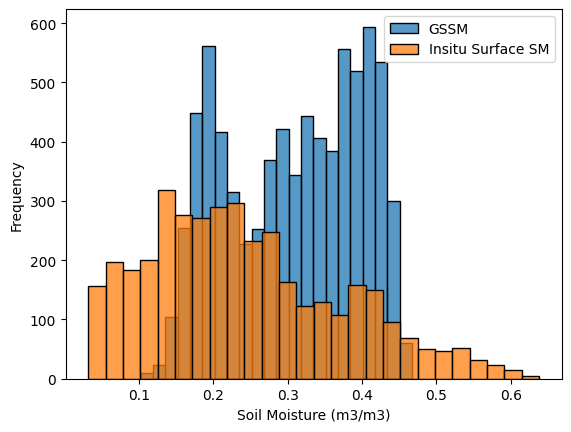

In [ ]:
sns.histplot(gssm['SSM'], label='GSSM')
sns.histplot(insitu_sm['_5_cm_SM'], label='Insitu Surface SM')
plt.xlabel('Soil Moisture (m3/m3)')
plt.ylabel('Frequency')
plt.legend()

In [ ]:
#Merging Insistu and grid SM dataset
gssm_insitu=pd.merge(gssm,insitu_sm[['Date','_5_cm_SM','_10_cm_SM','_20_cm_SM','_40_cm_SM']], on= 'Date', how='left').reset_index(drop=True)
gssm_insitu = gssm_insitu.dropna(subset=['SSM']).reset_index(drop=True)
gssm_insitu['Date'] = pd.to_datetime(gssm_insitu['Date'], format='%d-%m-%Y')
gssm_insitu

,Date,SSM,_5_cm_SM,_10_cm_SM,_20_cm_SM,_40_cm_SM
0,2001-01-01,0.410,NaN,NaN,NaN,NaN
1,2002-01-01,0.381,NaN,NaN,NaN,NaN
2,2003-01-01,0.427,NaN,NaN,NaN,NaN
3,2004-01-01,0.402,NaN,NaN,NaN,NaN
4,2005-01-01,0.450,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...
7544,2016-12-31,0.363,0.384375,0.423375,0.284292,0.311479
7545,2017-12-31,0.321,0.610812,0.536385,0.391135,0.389844
7546,2018-12-31,0.348,0.341271,0.354323,0.345792,0.316208
7547,2019-12-31,0.394,0.384333,0.397781,0.340865,0.315125


<function matplotlib.pyplot.show(close=None, block=None)>

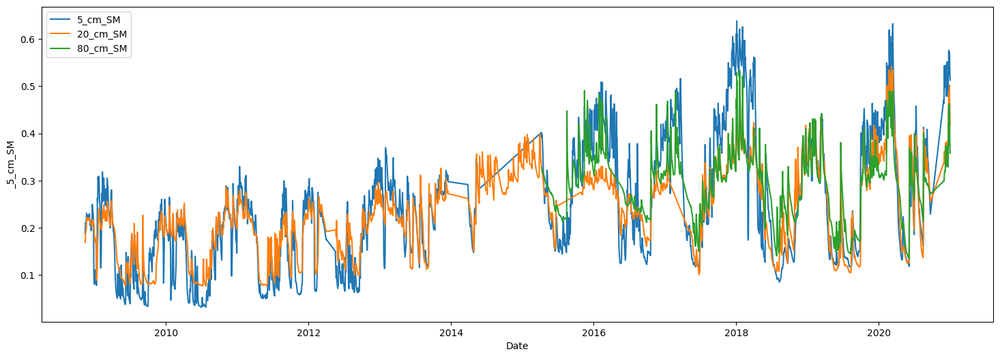

In [ ]:
plt.figure(figsize=(18, 6))
#sns.lineplot(x='Date', y='SSM', data=gssm)
sns.lineplot(x='Date', y='_5_cm_SM', data=gssm_insitu, label='5_cm_SM')
sns.lineplot(x='Date', y='_20_cm_SM', data=gssm_insitu,label='20_cm_SM')
sns.lineplot(x='Date', y='_40_cm_SM', data=gssm_insitu,label='80_cm_SM')
plt.show

In [ ]:
#Drop missing values at 20cm depth

clean_df = gssm_insitu.dropna(subset=['Date','SSM','_40_cm_SM','_20_cm_SM','_10_cm_SM','_5_cm_SM']).reset_index(drop=True)
dmnator=2*(5+5+10+20)
clean_df['Profile_40']=((2*5*clean_df['_5_cm_SM'])+((clean_df['_5_cm_SM']+clean_df['_10_cm_SM'])*5)+((clean_df['_10_cm_SM']+clean_df['_20_cm_SM'])*10)+((clean_df['_20_cm_SM']+clean_df['_40_cm_SM'])*20))/dmnator
clean_df = clean_df.dropna(subset=['Date','Profile_40'])
clean_df = clean_df.sort_values(by='Date').reset_index(drop=True)
clean_df

,Date,SSM,_5_cm_SM,_10_cm_SM,_20_cm_SM,_40_cm_SM,Profile_40
0,2015-04-09,0.340,0.402135,0.373385,0.330125,0.327354,0.351046
1,2015-04-10,0.312,0.397333,0.370385,0.326458,0.326688,0.348041
2,2015-04-11,0.346,0.391188,0.366198,0.323458,0.324688,0.344479
3,2015-04-12,0.297,0.397500,0.363594,0.320000,0.321115,0.342984
4,2015-04-13,0.315,0.389531,0.360198,0.315969,0.319125,0.338844
...,...,...,...,...,...,...,...
1662,2020-12-27,0.414,0.572000,0.512979,0.484302,0.460094,0.500070
1663,2020-12-28,0.410,0.570323,0.522292,0.502000,0.462396,0.508714
1664,2020-12-29,0.403,0.543063,0.477698,0.451125,0.398823,0.460270
1665,2020-12-30,0.416,0.527667,0.457771,0.430021,0.372802,0.439228


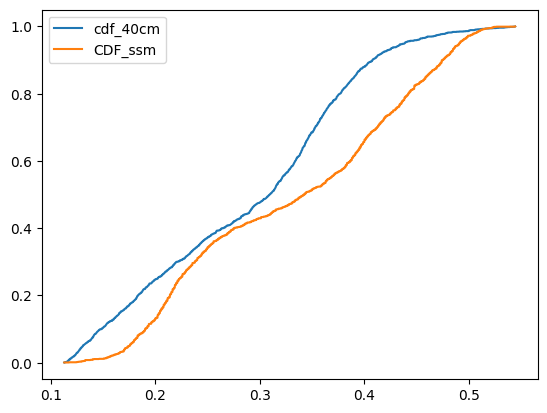

In [ ]:
# getting data of the histogram
count, bins_count = np.histogram(clean_df['SSM'], bins=1728 )
# finding the PDF of the histogram using count values
pdf_ssm = count / sum(count)
cdf_ssm = np.cumsum(pdf_ssm)





# getting data of the histogram
count, bins_count = np.histogram(clean_df['Profile_40'], bins=1728 )
# finding the PDF of the histogram using count values
pdf_20cm = count / sum(count)
cdf_20cm = np.cumsum(pdf_20cm)


# plotting PDF and CDF
plt.plot(bins_count[1:], cdf_20cm, label="cdf_40cm")
plt.plot(bins_count[1:], cdf_ssm, label="CDF_ssm")
plt.legend()

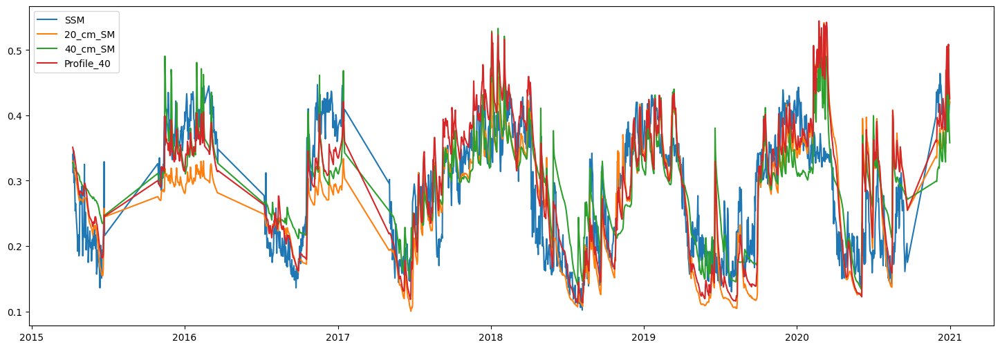

In [ ]:
plt.figure(figsize=(18, 6))
plt.plot(clean_df['Date'],clean_df['SSM'],label="SSM")
plt.plot(clean_df['Date'],clean_df['_20_cm_SM'],label="20_cm_SM")
plt.plot(clean_df['Date'],clean_df['_40_cm_SM'],label="40_cm_SM")
plt.plot(clean_df['Date'],clean_df['Profile_40'],label="Profile_40")
plt.legend()

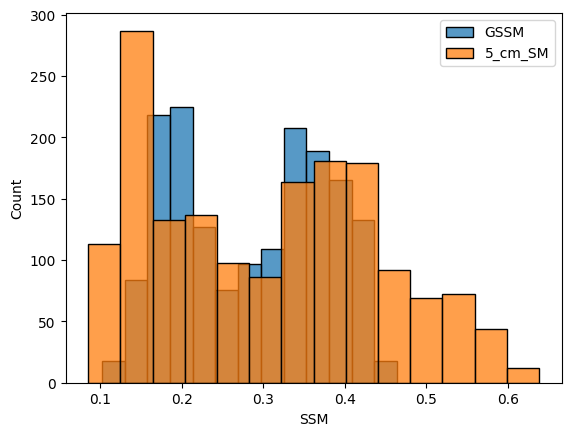

In [ ]:
sns.histplot(clean_df['SSM'],label="GSSM")
#sns.histplot(clean_df['_20_cm_SM'],label="20_cm_SM")
sns.histplot(clean_df['_5_cm_SM'],label="5_cm_SM")
plt.legend()

In [ ]:
clean_df['Date'] = pd.to_datetime(clean_df['Date'], format='%d-%m-%Y')
clean_df.head()

,Date,SSM,_5_cm_SM,_10_cm_SM,_20_cm_SM,_40_cm_SM,Profile_40
0,2015-04-09,0.340,0.402135,0.373385,0.330125,0.327354,0.351046
1,2015-04-10,0.312,0.397333,0.370385,0.326458,0.326688,0.348041
2,2015-04-11,0.346,0.391188,0.366198,0.323458,0.324688,0.344479
3,2015-04-12,0.297,0.397500,0.363594,0.320000,0.321115,0.342984
4,2015-04-13,0.315,0.389531,0.360198,0.315969,0.319125,0.338844


In [ ]:
#First step =>
#Data splitting
# Define the calibration and validation years
calibration_years = [2014,2015,2016,2017, 2018 ]
validation_years = [2019, 2020]

# Create boolean masks for calibration and validation sets
calibration_mask = clean_df['Date'].dt.year.isin(calibration_years)
validation_mask = clean_df['Date'].dt.year.isin(validation_years)

# Separate data into calibration and validation sets
cal_data = clean_df[calibration_mask]
val_data = clean_df[validation_mask]

# Optional: Reset index if needed
cal_data.reset_index(drop=True, inplace=True)
val_data.reset_index(drop=True, inplace=True)

In [ ]:
cal_data

,Date,SSM,_5_cm_SM,_10_cm_SM,_20_cm_SM,_40_cm_SM,Profile_40
0,2015-04-09,0.340,0.402135,0.373385,0.330125,0.327354,0.351046
1,2015-04-10,0.312,0.397333,0.370385,0.326458,0.326688,0.348041
2,2015-04-11,0.346,0.391188,0.366198,0.323458,0.324688,0.344479
3,2015-04-12,0.297,0.397500,0.363594,0.320000,0.321115,0.342984
4,2015-04-13,0.315,0.389531,0.360198,0.315969,0.319125,0.338844
...,...,...,...,...,...,...,...
1003,2018-12-27,0.418,0.342760,0.358365,0.357208,0.331969,0.348406
1004,2018-12-28,0.418,0.338188,0.351385,0.350010,0.324500,0.341674
1005,2018-12-29,0.376,0.339292,0.349135,0.344969,0.319906,0.338420
1006,2018-12-30,0.348,0.344865,0.356521,0.346448,0.317792,0.340876


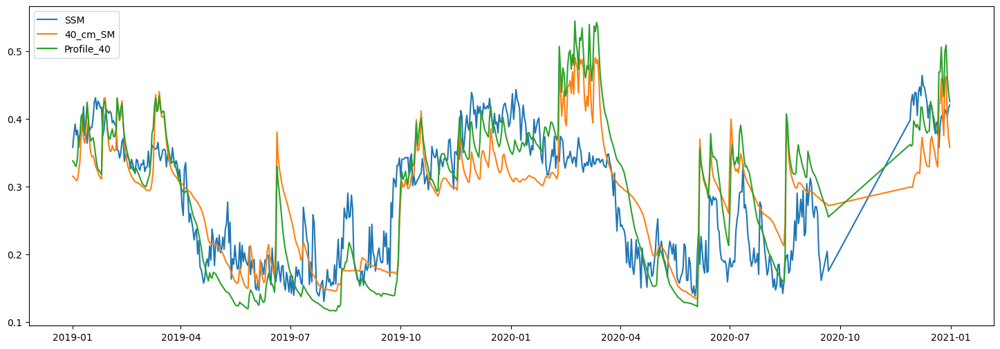

In [ ]:
plt.figure(figsize=(18, 6))
plt.plot(val_data['Date'],val_data['SSM'],label="SSM")
plt.plot(val_data['Date'],val_data['_40_cm_SM'],label="40_cm_SM")
plt.plot(val_data['Date'],val_data['Profile_40'],label="Profile_40")
plt.legend()

# **Calibration Phase**

In [ ]:
cal_data.head()

,Date,SSM,_5_cm_SM,_10_cm_SM,_20_cm_SM,_40_cm_SM,Profile_40,SSM_x,predicted_diff,Pred_40cm
0,2015-04-09,0.340,0.402135,0.373385,0.330125,0.327354,0.351046,0.340,0.009175,0.330825
1,2015-04-10,0.312,0.397333,0.370385,0.326458,0.326688,0.348041,0.312,0.005225,0.306775
2,2015-04-11,0.346,0.391188,0.366198,0.323458,0.324688,0.344479,0.346,0.009500,0.336500
3,2015-04-12,0.297,0.397500,0.363594,0.320000,0.321115,0.342984,0.297,0.001963,0.295037
4,2015-04-13,0.315,0.389531,0.360198,0.315969,0.319125,0.338844,0.315,0.005803,0.309197


**10cm**

In [ ]:
#Second step => Ranking
#Calibration
SSM_cal=cal_data['SSM'].sort_values(ascending=True).reset_index(drop=True)
CM80_cal=cal_data['_10_cm_SM'].sort_values(ascending=True).reset_index(drop=True)

#Validation
SSM_val=val_data['SSM'].sort_values(ascending=True).reset_index(drop=True)
CM80_val=val_data['_10_cm_SM'].sort_values(ascending=True).reset_index(drop=True)

In [ ]:
#Third step => Computing difference on the ranked values
ranked_diff=SSM_cal-CM80_cal

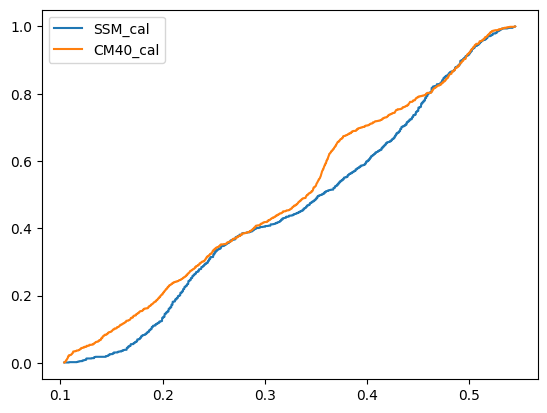

In [ ]:
# getting data of the histogram
count, bins_count = np.histogram(SSM_cal, bins=1810  )
# finding the PDF of the histogram using count values
pdf_SSM_cal = count / sum(count)
cdf_SSM_cal = np.cumsum(pdf_SSM_cal)


# getting data of the histogram
count, bins_count = np.histogram(CM80_cal, bins=1810  )
# finding the PDF of the histogram using count values
CM80_CM80_cal = count / sum(count)
cdf_CM80_cal = np.cumsum(CM80_CM80_cal)


# plotting PDF and CDF
plt.plot(bins_count[1:], cdf_SSM_cal, label="SSM_cal")
plt.plot(bins_count[1:], cdf_CM80_cal, label="CM40_cal")
plt.legend()

In [ ]:
from sklearn.preprocessing import PolynomialFeatures
import statsmodels.api as sm

# Reshape the SSM_cal values
SSM_re = SSM_cal.values.reshape(-1, 1)

# Dictionary to store models
cal_models = {}

# Iterate over polynomial degrees from 1 to 9
for degree in range(1, 10):
    # Create PolynomialFeatures instance
    poly_reg = PolynomialFeatures(degree=degree)
    X_poly = poly_reg.fit_transform(SSM_re)

    # Fit a polynomial regression model using statsmodels
    model = sm.OLS(ranked_diff, sm.add_constant(X_poly)).fit()

    # Store the model in the dictionary
    cal_models[f'cal_model_{degree}'] = model

In [ ]:
#Predict the calibration data phase
# Reshape the SSM_cal values
SSM_re2 = SSM_cal.values.reshape(-1, 1)

# Dictionary to store predicted values
predicted_diff1 = {}

# Iterate over the stored models
for degree, model in cal_models.items():
    # Extract the degree as a string
    degree_str = degree.split('_')[-1]

    # Create PolynomialFeatures instance for the same degree used during training
    poly_reg = PolynomialFeatures(degree=int(degree_str))
    X_poly = poly_reg.fit_transform(SSM_re2)

    # Predict ranked_diff using the model
    predicted_diff1[f'ranked_diff_{degree_str}'] = model.predict(sm.add_constant(X_poly))


In [ ]:
#Predict 80cm Soil Moisture in Calibration phase

# Dictionary to store predicted values
predicted_cal = {}
for degree,diff in predicted_diff1.items():
  # Extract the degree as a string
  degree_str = degree.split('_')[-1]
  predicted_cal[f'predicted_40cm_{degree_str}']=SSM_cal-diff

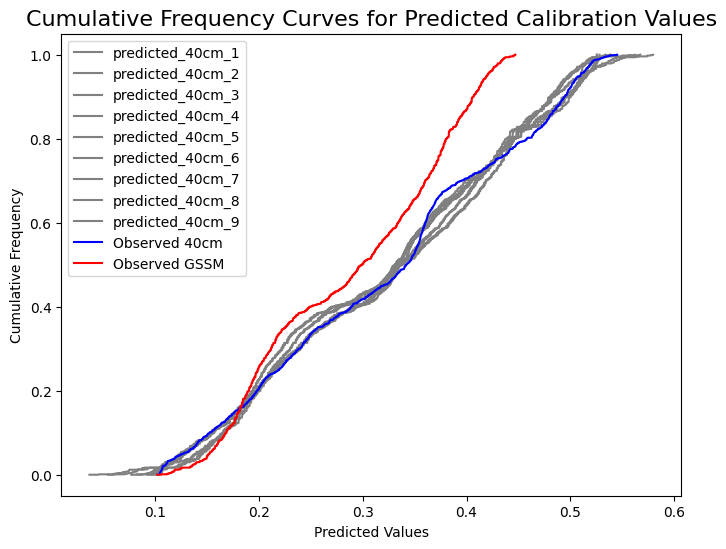

In [ ]:
# Create a single plot for all cumulative frequency curves
plt.figure(figsize=(8, 6))
plt.title('Cumulative Frequency Curves for Predicted Calibration Values', fontsize=16)

# Iterate over keys and draw cumulative frequency curves
for key, values in predicted_cal.items():
    count, bins_count = np.histogram(values, bins=1442)
    pdf_80cm = count / sum(count)
    cdf_80cm = np.cumsum(pdf_80cm)
    plt.plot(bins_count[1:], cdf_80cm, label=key, color='grey')


# Adding observed 80cm ssm
count, bins_count = np.histogram(CM80_cal, bins=1442 )
# finding the PDF of the histogram using count values
pdf_80cm_val = count / sum(count)
cdf_80cm_val = np.cumsum(pdf_80cm_val)
plt.plot(bins_count[1:], cdf_80cm_val, label="Observed 40cm", color ='blue')


# Adding smoothed gssm
count, bins_count = np.histogram(SSM_cal, bins=1442 )
# finding the PDF of the histogram using count values
pdf_gssm = count / sum(count)
cdf_gssm = np.cumsum(pdf_gssm)
plt.plot(bins_count[1:], cdf_gssm, label="Observed GSSM", color ='red')


plt.xlabel('Predicted Values')
plt.ylabel('Cumulative Frequency')
plt.legend()
plt.show()

In [ ]:
#Compute RMSE with respect to CM20_val


#A dictionary to store RMSE values
rmse_values={}

for degree, predicted in predicted_cal.items():
  # Extract the degree as a string
  degree_str = degree.split('_')[-1]
  rmse_values[f'Polynomial_{degree_str}']= np.sqrt(np.mean((CM80_val - predicted) ** 2))

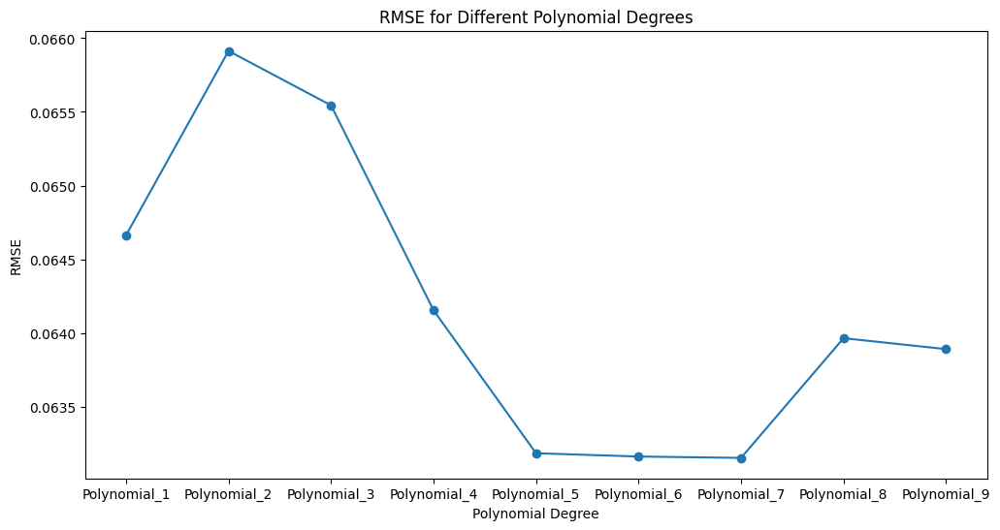

In [ ]:
#Vizualizing RMSE scores
plt.figure(figsize=(12, 6))

x = rmse_values.keys()
rmse_scores = list(rmse_values.values())

plt.plot(x, rmse_scores, marker='o')

plt.title('RMSE for Different Polynomial Degrees')
plt.xlabel('Polynomial Degree')
plt.ylabel('RMSE')
plt.show()


In [ ]:
best_model=cal_models['cal_model_3']
cal_data['SSM']

# Assuming cal_data is your DataFrame and 'SSM' is the input feature
cal_data['SSM_x'] = pd.to_numeric(cal_data['SSM'], errors='coerce')  # Ensure 'SSM' is numeric

# Reshape the 'SSM_x' values
SSM_cal_data = cal_data['SSM_x'].values.reshape(-1, 1)

# Use PolynomialFeatures to transform the input data
poly_reg = PolynomialFeatures(degree=3)
X_poly_cal_data = poly_reg.fit_transform(SSM_cal_data)

# Make predictions using the best model
predicted_diff_cal_data = best_model.predict(sm.add_constant(X_poly_cal_data))

# Add the predicted differences to the cal_data DataFrame
cal_data['predicted_diff'] = predicted_diff_cal_data

cal_data['Pred_40cm']=cal_data['SSM']-cal_data['predicted_diff']

<ipython-input-179-a0e8aa250655>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cal_data['SSM_x'] = pd.to_numeric(cal_data['SSM'], errors='coerce')  # Ensure 'SSM' is numeric
<ipython-input-179-a0e8aa250655>:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cal_data['predicted_diff'] = predicted_diff_cal_data
<ipython-input-179-a0e8aa250655>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the cavea

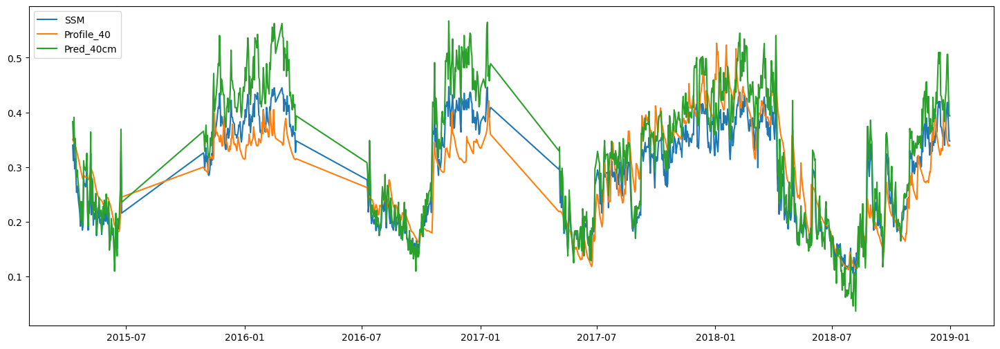

In [ ]:
plt.figure(figsize=(18, 6))
plt.plot(cal_data['Date'],cal_data['SSM'],label="SSM")
plt.plot(cal_data['Date'],cal_data['Profile_40'],label="Profile_40")
plt.plot(cal_data['Date'],cal_data['Pred_40cm'],label="Pred_40cm")
plt.legend()

In [ ]:
rmse=np.sqrt(np.mean((cal_data['Profile_40'] - cal_data['Pred_40cm']) ** 2))
rmse

0.07619881762208273

In [ ]:
correlation=cal_data['Profile_40'].corr(cal_data['Pred_40cm'])
print("Correlation btn 1Km SSM and Insitu 5cm SM is:", correlation)

Correlation btn 1Km SSM and Insitu 5cm SM is: 0.8258214481735259


# **Validation**

In [ ]:
#Validation phase
# Reshape the SSM_val values
SSM_re2 = SSM_val.values.reshape(-1, 1)

# Dictionary to store predicted values
predicted_diff = {}

# Iterate over the stored models
for degree, model in cal_models.items():
    # Extract the degree as a string
    degree_str = degree.split('_')[-1]

    # Create PolynomialFeatures instance for the same degree used during training
    poly_reg = PolynomialFeatures(degree=int(degree_str))
    X_poly = poly_reg.fit_transform(SSM_re2)

    # Predict ranked_diff using the model
    predicted_diff[f'ranked_diff_{degree_str}'] = model.predict(sm.add_constant(X_poly))



In [ ]:
#Predict 40cm Soil Moisture in validation phase
CM80_val=val_data['Profile_40'].sort_values(ascending=True).reset_index(drop=True)

# Dictionary to store predicted values
predicted_80cm = {}
for degree,diff in predicted_diff.items():
  # Extract the degree as a string
  degree_str = degree.split('_')[-1]
  predicted_80cm[f'predicted_40cm_{degree_str}']=SSM_val-diff

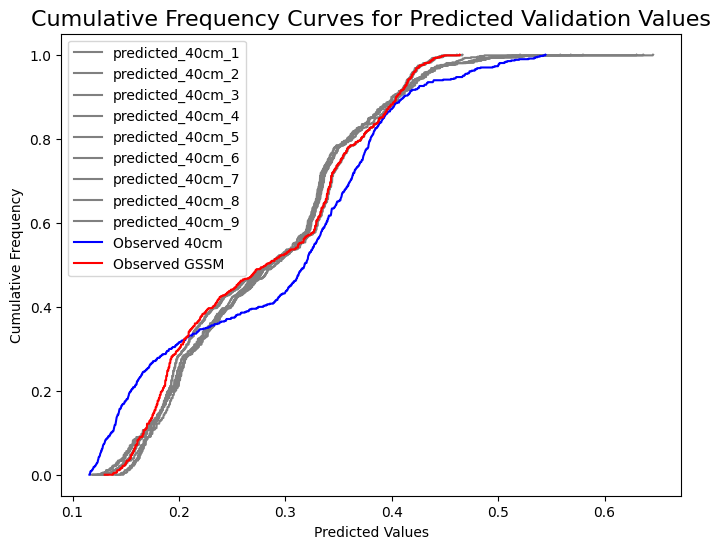

In [ ]:
# Create a single plot for all cumulative frequency curves
plt.figure(figsize=(8, 6))
plt.title('Cumulative Frequency Curves for Predicted Validation Values', fontsize=16)

# Iterate over keys and draw cumulative frequency curves
for key, values in predicted_80cm.items():
    count, bins_count = np.histogram(values, bins=1442)
    pdf_80cm = count / sum(count)
    cdf_80cm = np.cumsum(pdf_80cm)
    plt.plot(bins_count[1:], cdf_80cm, label=key, color='grey')


# Adding observed 80cm ssm
count, bins_count = np.histogram(CM80_val, bins=1442 )
# finding the PDF of the histogram using count values
pdf_80cm_val = count / sum(count)
cdf_80cm_val = np.cumsum(pdf_80cm_val)
plt.plot(bins_count[1:], cdf_80cm_val, label="Observed 40cm", color ='blue')


# Adding smoothed gssm
count, bins_count = np.histogram(SSM_val, bins=1442 )
# finding the PDF of the histogram using count values
pdf_gssm = count / sum(count)
cdf_gssm = np.cumsum(pdf_gssm)
plt.plot(bins_count[1:], cdf_gssm, label="Observed GSSM", color ='red')


plt.xlabel('Predicted Values')
plt.ylabel('Cumulative Frequency')
plt.legend()
plt.show()


In [ ]:
#Compute RMSE with respect to CM20_val


#A dictionary to store RMSE values
rmse_values={}

for degree, predicted in predicted_80cm.items():
  # Extract the degree as a string
  degree_str = degree.split('_')[-1]
  rmse_values[f'Polynomial_{degree_str}']= np.sqrt(np.mean((CM80_val - predicted) ** 2))


In [ ]:
rmse_values

{'Polynomial_1': 0.030658103027540996,
 'Polynomial_2': 0.031003775783048207,
 'Polynomial_3': 0.029972345215086422,
 'Polynomial_4': 0.027090431109062302,
 'Polynomial_5': 0.02698723591962862,
 'Polynomial_6': 0.02720173900679727,
 'Polynomial_7': 0.02718296994626261,
 'Polynomial_8': 0.026708071112098213,
 'Polynomial_9': 0.02720547177821934}

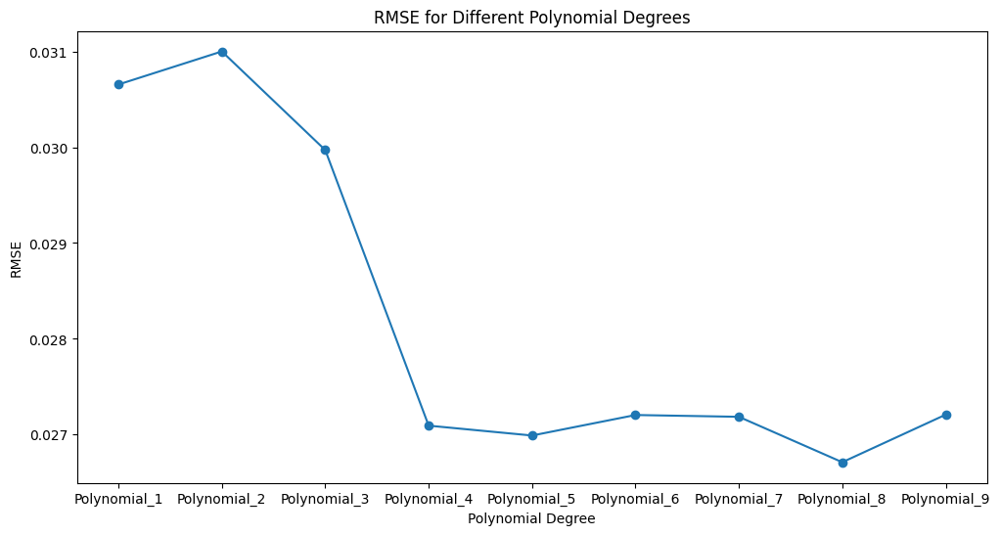

In [ ]:
#Vizualizing RMSE scores
plt.figure(figsize=(12, 6))

x = rmse_values.keys()
rmse_scores = list(rmse_values.values())

plt.plot(x, rmse_scores, marker='o')

plt.title('RMSE for Different Polynomial Degrees')
plt.xlabel('Polynomial Degree')
plt.ylabel('RMSE')
plt.show()


In [ ]:
best_model=cal_models['cal_model_3']
cal_data['SSM']

# Assuming cal_data is your DataFrame and 'SSM' is the input feature
val_data['SSM_x'] = pd.to_numeric(val_data['SSM'], errors='coerce')  # Ensure 'SSM' is numeric

# Reshape the 'SSM_x' values
SSM_val_data = val_data['SSM_x'].values.reshape(-1, 1)

# Use PolynomialFeatures to transform the input data
poly_reg = PolynomialFeatures(degree=3)
X_poly_val_data = poly_reg.fit_transform(SSM_val_data)

# Make predictions using the best model
predicted_diff_val_data = best_model.predict(sm.add_constant(X_poly_val_data))

# Add the predicted differences to the cal_data DataFrame
val_data['predicted_diff'] = predicted_diff_val_data

val_data['Pred_40cm']=val_data['SSM']-val_data['predicted_diff']

<ipython-input-165-9b7aa19e47fb>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  val_data['SSM_x'] = pd.to_numeric(val_data['SSM'], errors='coerce')  # Ensure 'SSM' is numeric
<ipython-input-165-9b7aa19e47fb>:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  val_data['predicted_diff'] = predicted_diff_val_data
<ipython-input-165-9b7aa19e47fb>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the cavea

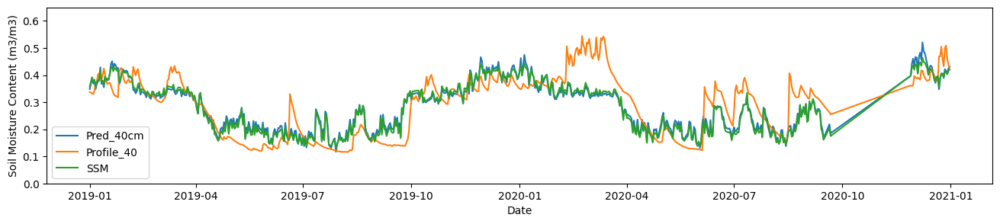

In [ ]:
fig, ax1 = plt.subplots(figsize=(16, 3))
# Set the y-axis limits to start from 0
ax1.set_ylim(0, 0.65)

plt.plot(val_data['Date'],val_data['Pred_40cm'],label="Pred_40cm")
plt.plot(val_data['Date'],val_data['Profile_40'],label="Profile_40")

# Set labels and title
plt.xlabel('Date', fontsize=10)
plt.ylabel('Soil Moisture Content (m3/m3)', fontsize=10)

plt.plot(val_data['Date'],val_data['SSM'],label="SSM")
plt.legend()

In [ ]:
rmse=np.sqrt(np.mean((val_data['Profile_40'] - val_data['Pred_40cm']) ** 2))
rmse

0.07067271486490903

In [ ]:
correlation=val_data['Profile_40'].corr(val_data['Pred_40cm'])
print("Correlation btn 1Km SSM and Insitu 80cm SM is:", correlation)

Correlation btn 1Km SSM and Insitu 80cm SM is: 0.7702884170191612


In [ ]:
mean_prd80=val_data['Pred_40cm'].mean()
mean_prd80

0.2836219214230953

In [ ]:
std_prd80=val_data['Pred_40cm'].std()
cv_prd80=std_prd80/mean_prd80
cv_prd80

0.3085852243011998

In [ ]:
mean_SSM=val_data['SSM'].mean()
mean_SSM

0.2799863429438543

In [ ]:
std_SSM=val_data['SSM'].std()
cv_SSM=std_SSM/mean_SSM
cv_SSM

0.3240340812247517

In [ ]:
mean_80cm=val_data['Profile_40'].mean()
mean_80cm

0.288012478463265

In [ ]:
std_80cm=val_data['Profile_40'].std()
cv_80cm=std_80cm/mean_80cm
cv_80cm

0.3841372991529878

In [ ]:
val_data['dff']=val_data['Profile_40']-val_data['Pred_40cm']

<ipython-input-128-9a5f05427430>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  val_data['dff']=val_data['Profile_40']-val_data['Pred_40cm']
